# Wasserstein-based clustering

In [1]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.cluster import KMeans
from wkmeans_pipeline import wkmeans_pipeline
from MAslope import ma_slope

In [2]:
# Data
df = pd.read_parquet("btc_binance_1d.parquet")
df.head()

,Open,High,Low,Close,Volume
Date,,,,,
2017-08-17,4261.48,4485.39,4200.74,4285.08,795.150377
2017-08-18,4285.08,4371.52,3938.77,4108.37,1199.888264
2017-08-19,4108.37,4184.69,3850.00,4139.98,381.309763
2017-08-20,4120.98,4211.08,4032.62,4086.29,467.083022
2017-08-21,4069.13,4119.62,3911.79,4016.00,691.743060


In [5]:
# Data
df_features = pd.read_parquet("btc_features.parquet")
df_features.head()

,Returns,slope_7,slope_14,slope_21,slope_30
Date,,,,,
2017-09-16,0.004032,-1.073904,-1.195123,-0.977491,-0.757684
2017-09-17,-0.004035,-0.911085,-1.097203,-0.930232,-0.737324
2017-09-18,0.086679,1.495757,0.169982,-0.099188,-0.168323
2017-09-19,-0.031461,0.311813,-0.270929,-0.370303,-0.353649
2017-09-20,-0.002571,0.168780,-0.269161,-0.360412,-0.347754


## Number of clusters

======== K-Means ========
For no of clusters = 2  The average silhouette_score is : 0.4394641688968798
For no of clusters = 3  The average silhouette_score is : 0.46570170567291325
For no of clusters = 4  The average silhouette_score is : 0.41507449762503995
For no of clusters = 5  The average silhouette_score is : 0.40496263914036335
For no of clusters = 6  The average silhouette_score is : 0.37251710791795867
For no of clusters = 7  The average silhouette_score is : 0.36395061463676087
For no of clusters = 8  The average silhouette_score is : 0.3390629547690167
For no of clusters = 9  The average silhouette_score is : 0.3235467234139404
For no of clusters = 10  The average silhouette_score is : 0.3244717430552893


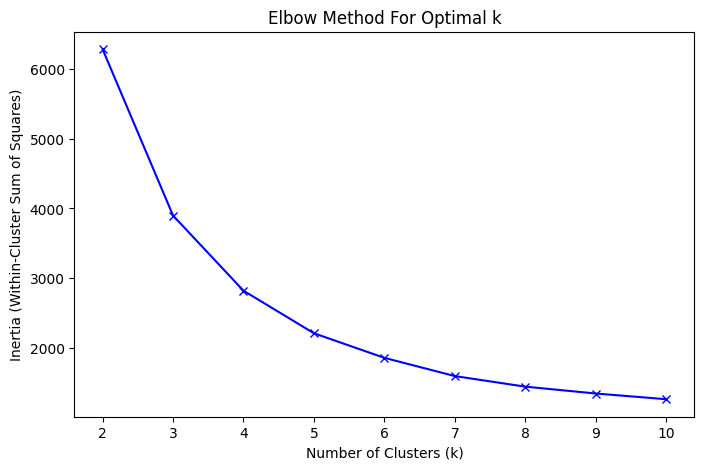

In [ ]:
from sklearn.metrics import silhouette_score

# Define dataset
dataset = df_features.values
inertia = []
no_of_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
print('======== K-Means ========')
for n_clusters in no_of_clusters:

    cluster = KMeans(n_clusters=n_clusters)
    cluster_labels = cluster.fit_predict(dataset)

    inertia.append(cluster.inertia_)
    silhouette_avg = silhouette_score(dataset, cluster_labels)

    print("For no of clusters =", n_clusters,
          " The average silhouette_score is :", silhouette_avg)
    
plt.figure(figsize=(8, 5))
plt.plot(no_of_clusters, inertia, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (Within-Cluster Sum of Squares)')
plt.title('Elbow Method For Optimal k')
plt.show()

Try 2, 3, 4 clusters with K-Means

## K-Means

### 2 clusters

In [27]:
kmeans=KMeans(n_clusters=2, random_state=1)
kmeans.fit(dataset)
df_features['cluster'] = kmeans.predict(dataset).tolist()
df_features['cluster'] = df_features['cluster'].map({0: 1, 1: 0})

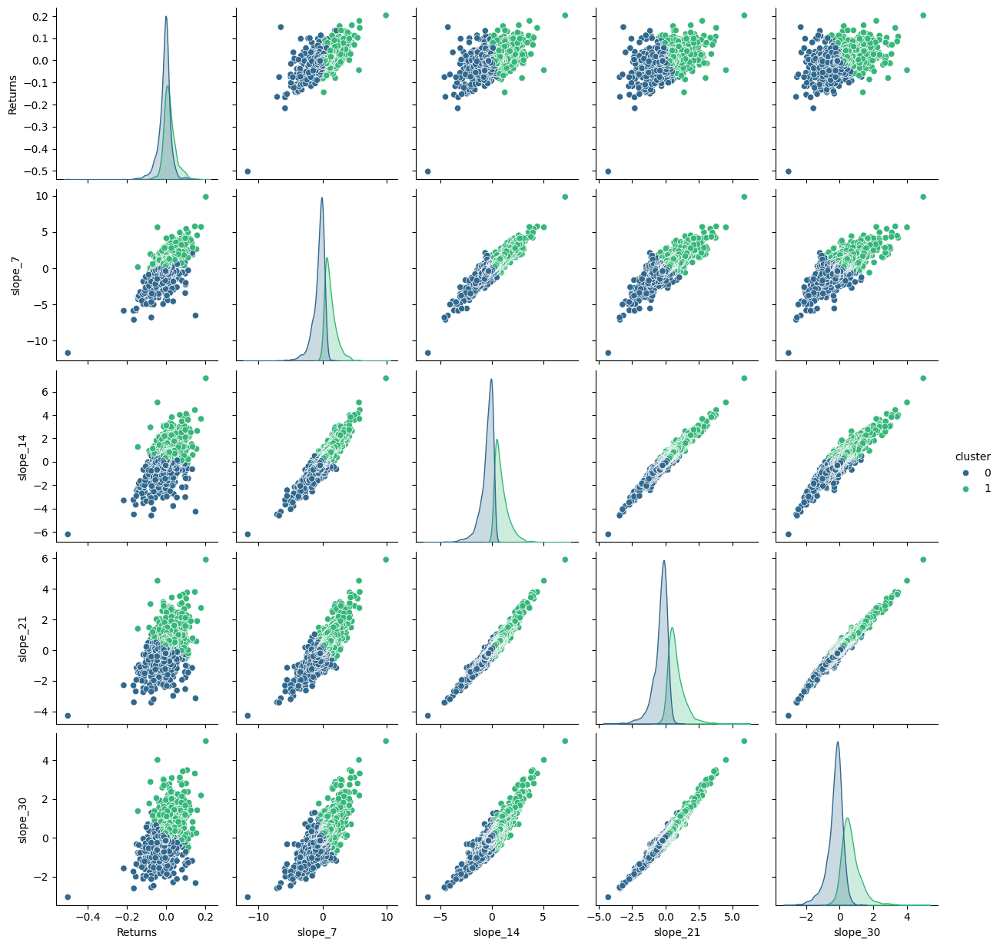

In [7]:
sns.pairplot(df_features, hue='cluster', palette='viridis', diag_kind='kde')
plt.show();

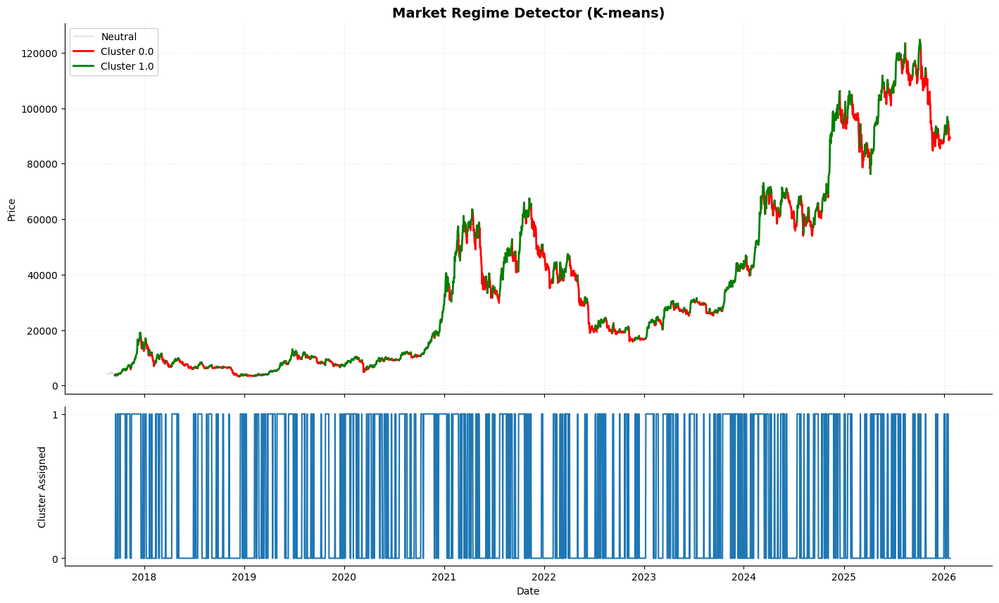

In [28]:
# Plot price by K-means
df['cluster'] = df_features['cluster']
close_neutral = df['Close']
colors = {0.0: "red", 1.0: "green"}
close_cluster = {}

for c in colors.keys():
    mask = (df['cluster'] == c) | (df['cluster'].shift(-1) == c)
    series = df['Close'].copy()
    series[~mask] = np.nan
    close_cluster[c] = series

fig, (ax1, ax2) = plt.subplots(
    2, 1, 
    figsize=(17, 10), 
    sharex=True, 
    gridspec_kw={'height_ratios': [0.7, 0.3], 'hspace': 0.05}
)

ax1.plot(df.index, close_neutral, color='gray', linewidth=1, label='Neutral', alpha=0.3)

for c, series in close_cluster.items():
    ax1.plot(df.index, series, color=colors[c], linewidth=2.0, label=f"Cluster {c}")

ax1.set_title("Market Regime Detector (K-means)", fontsize=14, fontweight='bold')
ax1.legend(loc='upper left', frameon=True, facecolor='white', framealpha=0.9)
ax1.grid(color='gray', linestyle=':', linewidth=0.5, alpha=0.3)
ax1.set_ylabel("Price")

ax2.plot(df.index, df['cluster'], color='tab:blue', linewidth=1.5, label='Cluster')
ax2.set_yticks([0, 1])
ax2.set_ylabel("Cluster Assigned")
ax2.grid(color='gray', linestyle=':', linewidth=0.5, alpha=0.3)

for ax in [ax1, ax2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.xlabel("Date")
plt.show();

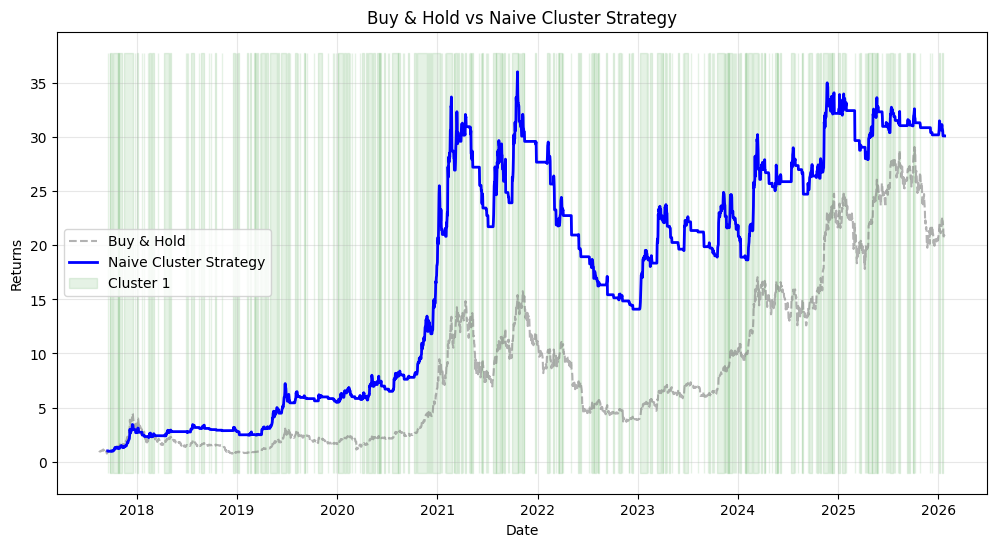

Total Returns Buy & Hold: 1985.56%
Total Returns Naive Cluster Strategy: 2910.86%


In [15]:
df['Returns'] = df['Close'].pct_change()

df['BH_Returns'] = df['Returns'].fillna(0)
df['BH_Cumulative'] = (1 + df['BH_Returns']).cumprod()

df['Signal'] = df['cluster'].shift(1)

df['Strategy_Returns'] = df['Returns'] * df['Signal']
df['Strategy_Cumulative'] = (1 + df['Strategy_Returns']).cumprod()


plt.figure(figsize=(12, 6))

plt.plot(df.index, df['BH_Cumulative'], label='Buy & Hold', color='gray', alpha=0.6, linestyle='--')

plt.plot(df.index, df['Strategy_Cumulative'], label='Naive Cluster Strategy', color='blue', linewidth=2)

y_min, y_max = plt.ylim()
plt.fill_between(df.index, y_min, y_max, where=(df['cluster']==1), 
                 color='green', alpha=0.1, label='Cluster 1')

plt.title('Buy & Hold vs Naive Cluster Strategy')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show();

total_return_bh = (df['BH_Cumulative'].iloc[-1] - 1) * 100
total_return_strat = (df['Strategy_Cumulative'].iloc[-1] - 1) * 100

print(f"Total Returns Buy & Hold: {total_return_bh:.2f}%")
print(f"Total Returns Naive Cluster Strategy: {total_return_strat:.2f}%")

### 3 clusters

In [29]:
kmeans=KMeans(n_clusters=3, random_state=1)
kmeans.fit(dataset)
df_features['cluster'] = kmeans.predict(dataset).tolist()
df_features['cluster'] = df_features['cluster'].map({0: 2, 1: 0, 2: 1})

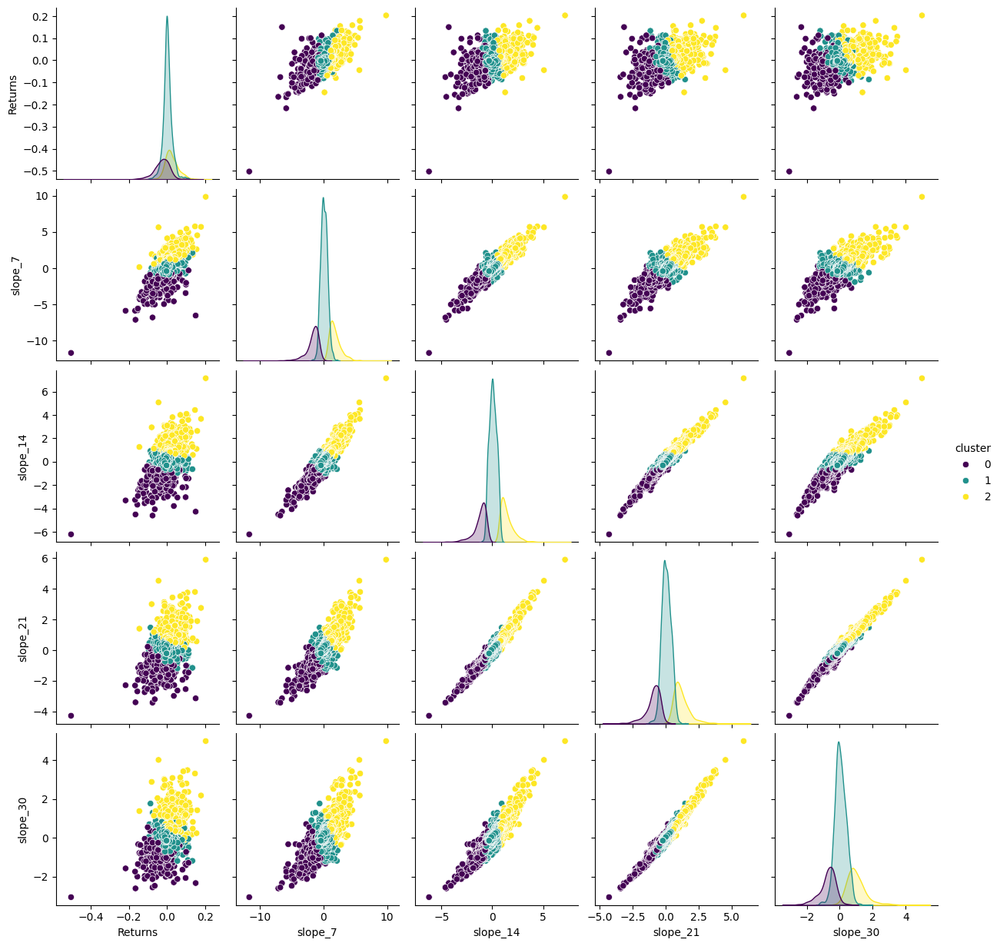

In [17]:
sns.pairplot(df_features, hue='cluster', palette='viridis', diag_kind='kde')
plt.show();

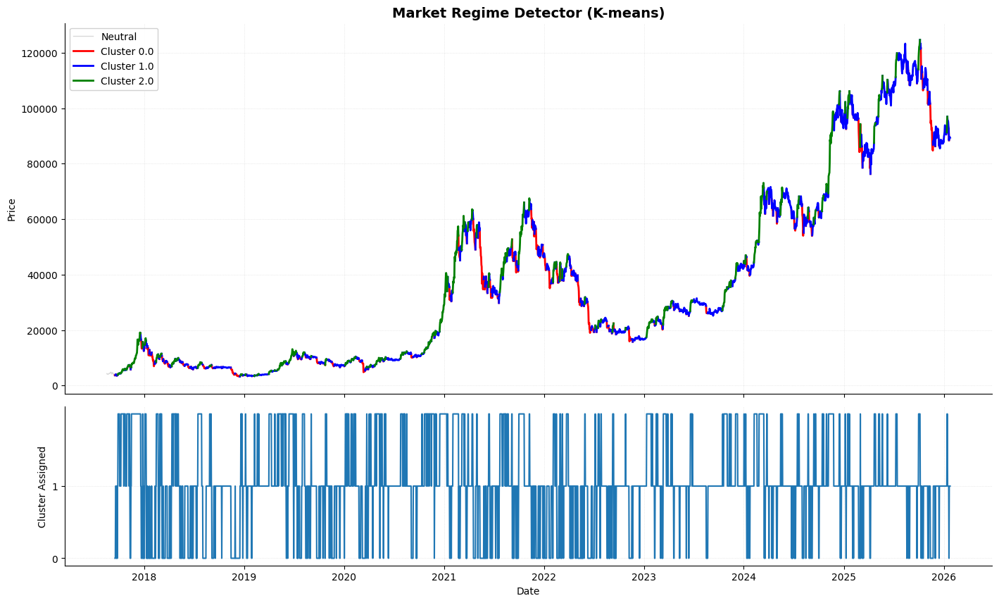

In [30]:
# Plot price by K-means
df['cluster'] = df_features['cluster']
close_neutral = df['Close']
colors = {0.0: "red", 1.0: "blue", 2.0: "green"}
close_cluster = {}

for c in colors.keys():
    mask = (df['cluster'] == c) | (df['cluster'].shift(-1) == c)
    series = df['Close'].copy()
    series[~mask] = np.nan
    close_cluster[c] = series

fig, (ax1, ax2) = plt.subplots(
    2, 1, 
    figsize=(17, 10), 
    sharex=True, 
    gridspec_kw={'height_ratios': [0.7, 0.3], 'hspace': 0.05}
)

ax1.plot(df.index, close_neutral, color='gray', linewidth=1, label='Neutral', alpha=0.3)

for c, series in close_cluster.items():
    ax1.plot(df.index, series, color=colors[c], linewidth=2.0, label=f"Cluster {c}")

ax1.set_title("Market Regime Detector (K-means)", fontsize=14, fontweight='bold')
ax1.legend(loc='upper left', frameon=True, facecolor='white', framealpha=0.9)
ax1.grid(color='gray', linestyle=':', linewidth=0.5, alpha=0.3)
ax1.set_ylabel("Price")

ax2.plot(df.index, df['cluster'], color='tab:blue', linewidth=1.5, label='Cluster')
ax2.set_yticks([0, 1])
ax2.set_ylabel("Cluster Assigned")
ax2.grid(color='gray', linestyle=':', linewidth=0.5, alpha=0.3)

for ax in [ax1, ax2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.xlabel("Date")
plt.show();

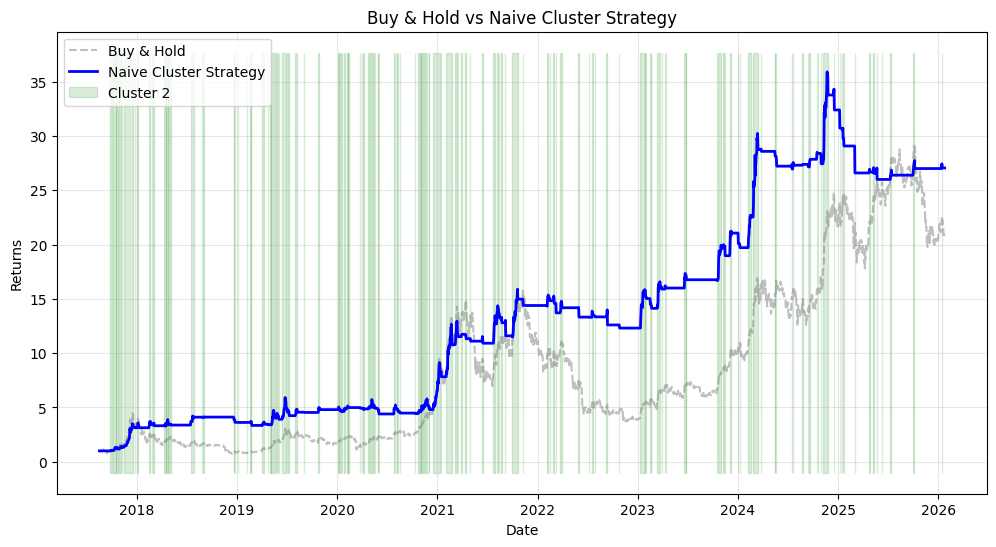

Total Returns Buy & Hold: 1985.56%
Total Returns Naive Cluster Strategy: 2605.08%


In [31]:
df['Returns'] = df['Close'].pct_change()

df['BH_Returns'] = df['Returns'].fillna(0)
df['BH_Cumulative'] = (1 + df['BH_Returns']).cumprod()

is_target_cluster = (df['cluster'] == 2)

df['Signal'] = is_target_cluster.shift(1).fillna(0).astype(int)

df['Strategy_Returns'] = df['Returns'] * df['Signal']
df['Strategy_Cumulative'] = (1 + df['Strategy_Returns']).cumprod()

plt.figure(figsize=(12, 6))

plt.plot(df.index, df['BH_Cumulative'], label='Buy & Hold', color='gray', alpha=0.5, linestyle='--')

plt.plot(df.index, df['Strategy_Cumulative'], label='Naive Cluster Strategy', color='blue', linewidth=2)

y_min, y_max = plt.ylim()
plt.fill_between(df.index, y_min, y_max, where=(df['cluster'] == 2), 
                 color='green', alpha=0.15, label='Cluster 2')

plt.title('Buy & Hold vs Naive Cluster Strategy')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.show()

total_return_bh = (df['BH_Cumulative'].iloc[-1] - 1) * 100
total_return_strat = (df['Strategy_Cumulative'].iloc[-1] - 1) * 100

print(f"Total Returns Buy & Hold: {total_return_bh:.2f}%")
print(f"Total Returns Naive Cluster Strategy: {total_return_strat:.2f}%")

### 4 clusters

In [32]:
kmeans=KMeans(n_clusters=4, random_state=1)
kmeans.fit(dataset)
df_features['cluster'] = kmeans.predict(dataset).tolist()
df_features['cluster'] = df_features['cluster'].map({0: 3, 1: 0, 2: 1, 3: 2})

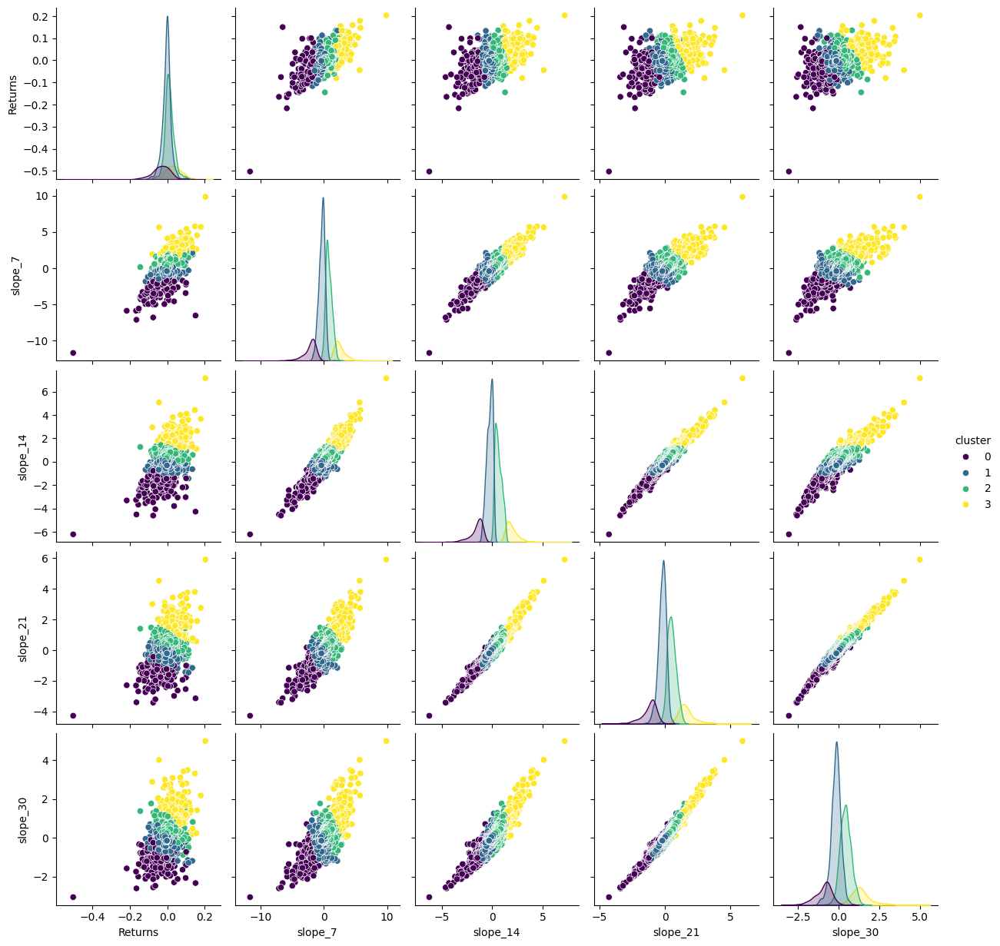

In [22]:
sns.pairplot(df_features, hue='cluster', palette='viridis', diag_kind='kde')
plt.show();

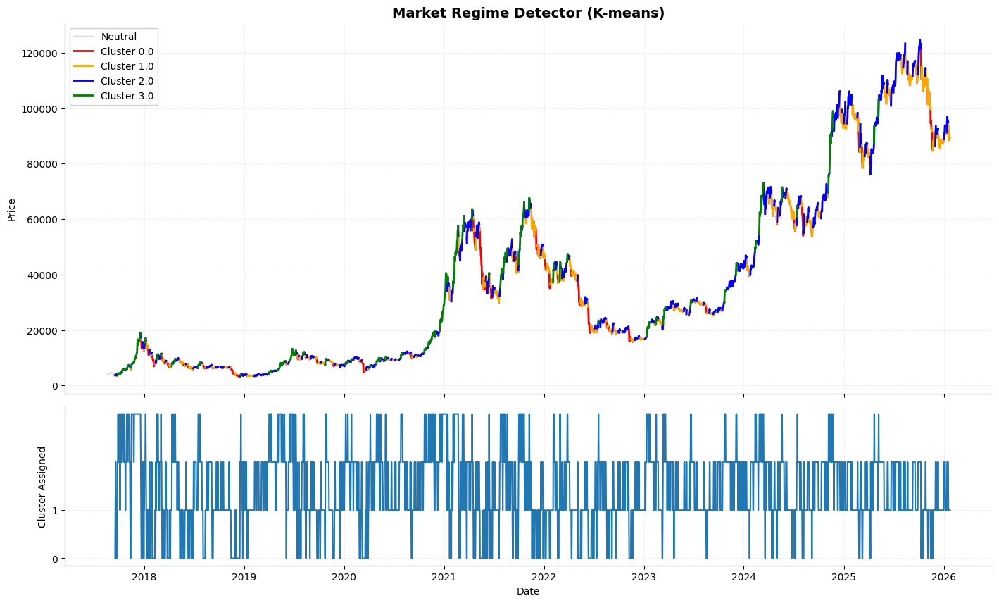

In [33]:
# Plot price by K-means
df['cluster'] = df_features['cluster']
close_neutral = df['Close']
colors = {0.0: "red", 1.0: "orange", 2.0: "blue", 3.0: "green"}
close_cluster = {}

for c in colors.keys():
    mask = (df['cluster'] == c) | (df['cluster'].shift(-1) == c)
    series = df['Close'].copy()
    series[~mask] = np.nan
    close_cluster[c] = series

fig, (ax1, ax2) = plt.subplots(
    2, 1, 
    figsize=(17, 10), 
    sharex=True, 
    gridspec_kw={'height_ratios': [0.7, 0.3], 'hspace': 0.05}
)

ax1.plot(df.index, close_neutral, color='gray', linewidth=1, label='Neutral', alpha=0.3)

for c, series in close_cluster.items():
    ax1.plot(df.index, series, color=colors[c], linewidth=2.0, label=f"Cluster {c}")

ax1.set_title("Market Regime Detector (K-means)", fontsize=14, fontweight='bold')
ax1.legend(loc='upper left', frameon=True, facecolor='white', framealpha=0.9)
ax1.grid(color='gray', linestyle=':', linewidth=0.5, alpha=0.3)
ax1.set_ylabel("Price")

ax2.plot(df.index, df['cluster'], color='tab:blue', linewidth=1.5, label='Cluster')
ax2.set_yticks([0, 1])
ax2.set_ylabel("Cluster Assigned")
ax2.grid(color='gray', linestyle=':', linewidth=0.5, alpha=0.3)

for ax in [ax1, ax2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.xlabel("Date")
plt.show();

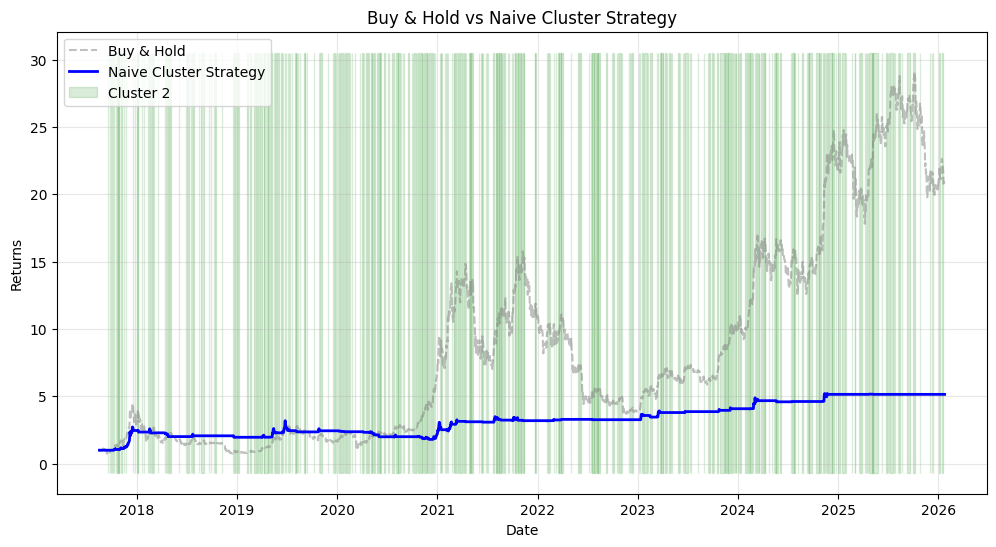

Total Returns Buy & Hold: 1985.56%
Total Returns Naive Cluster Strategy: 414.46%


In [34]:
df['Returns'] = df['Close'].pct_change()

df['BH_Returns'] = df['Returns'].fillna(0)
df['BH_Cumulative'] = (1 + df['BH_Returns']).cumprod()

is_target_cluster = (df['cluster'] == 3)

df['Signal'] = is_target_cluster.shift(1).fillna(0).astype(int)

df['Strategy_Returns'] = df['Returns'] * df['Signal']
df['Strategy_Cumulative'] = (1 + df['Strategy_Returns']).cumprod()

plt.figure(figsize=(12, 6))

plt.plot(df.index, df['BH_Cumulative'], label='Buy & Hold', color='gray', alpha=0.5, linestyle='--')

plt.plot(df.index, df['Strategy_Cumulative'], label='Naive Cluster Strategy', color='blue', linewidth=2)

y_min, y_max = plt.ylim()
plt.fill_between(df.index, y_min, y_max, where=(df['cluster'] == 2), 
                 color='green', alpha=0.15, label='Cluster 2')

plt.title('Buy & Hold vs Naive Cluster Strategy')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.show()

total_return_bh = (df['BH_Cumulative'].iloc[-1] - 1) * 100
total_return_strat = (df['Strategy_Cumulative'].iloc[-1] - 1) * 100

print(f"Total Returns Buy & Hold: {total_return_bh:.2f}%")
print(f"Total Returns Naive Cluster Strategy: {total_return_strat:.2f}%")

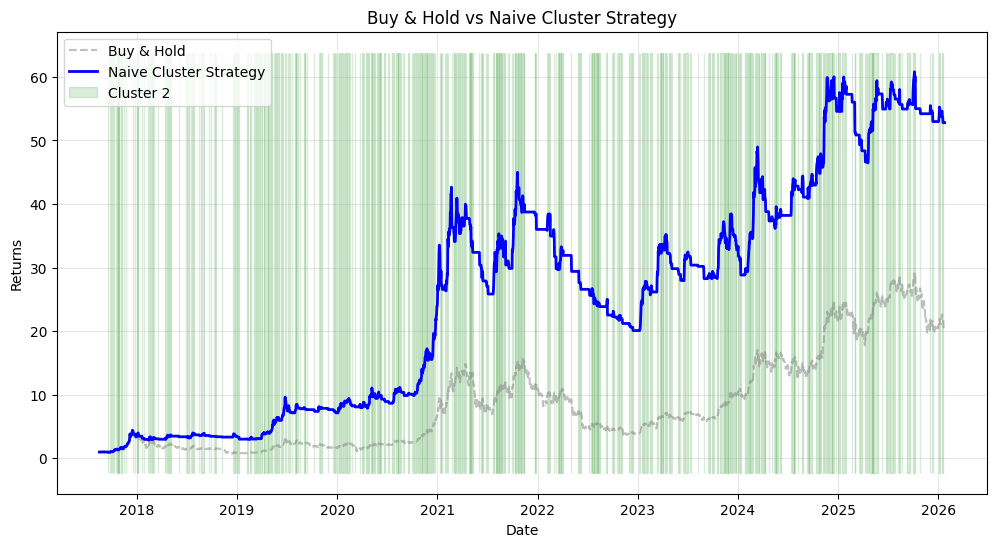

Total Returns Buy & Hold: 1985.56%
Total Returns Naive Cluster Strategy: 5179.80%


In [35]:
df['Returns'] = df['Close'].pct_change()

df['BH_Returns'] = df['Returns'].fillna(0)
df['BH_Cumulative'] = (1 + df['BH_Returns']).cumprod()

is_target_cluster = (df['cluster'] >= 2)

df['Signal'] = is_target_cluster.shift(1).fillna(0).astype(int)

df['Strategy_Returns'] = df['Returns'] * df['Signal']
df['Strategy_Cumulative'] = (1 + df['Strategy_Returns']).cumprod()

plt.figure(figsize=(12, 6))

plt.plot(df.index, df['BH_Cumulative'], label='Buy & Hold', color='gray', alpha=0.5, linestyle='--')

plt.plot(df.index, df['Strategy_Cumulative'], label='Naive Cluster Strategy', color='blue', linewidth=2)

y_min, y_max = plt.ylim()
plt.fill_between(df.index, y_min, y_max, where=(df['cluster'] == 2), 
                 color='green', alpha=0.15, label='Cluster 2')

plt.title('Buy & Hold vs Naive Cluster Strategy')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.show()

total_return_bh = (df['BH_Cumulative'].iloc[-1] - 1) * 100
total_return_strat = (df['Strategy_Cumulative'].iloc[-1] - 1) * 100

print(f"Total Returns Buy & Hold: {total_return_bh:.2f}%")
print(f"Total Returns Naive Cluster Strategy: {total_return_strat:.2f}%")

## WK-Means

### 2 clusters

In [4]:
model, log_returns_dist = wkmeans_pipeline(
    df=df,
    df_features=df_features,
    window_size=10,        # Size of rolling window for distributions
    k=2,                   # Number of clusters
    p=1,                   # Order of Wasserstein distance
    scale=True,            # Scale features
    split=0.6,             # 60% train, 40% test
    state_labels=['Bullish', 'Bearish'],
    tolerance=1e-4,
    max_iter=100,
    seed=42
)

Shapes before alignment: df=(3083, 5), df_features=(3053, 5)
Shapes after alignment: df=(3053, 5), df_features=(3053, 5)
Training data: 1831 candles (2017-09-16 - 2022-09-20)
Test data: 1222 candles (2022-09-21 - 2026-01-24)
Scaling features using StandardScaler...
Creating rolling window distributions (window_size=10)...
Created 1821 training samples
Training WKMeans with k=2, p=1...
Converged at iteration 8
Training completed. Inertia: 699.4363

State mapping: {np.int64(0): 'Bullish', np.int64(1): 'Bearish'}
State distribution (train):
Regime_Label
Bearish    1058
Bullish     763
Name: count, dtype: int64



State distribution (test):
Regime_Label
Bearish    741
Bullish    471
Name: count, dtype: int64



LOG RETURNS DISTRIBUTION BY CLUSTER (OUT-OF-SAMPLE)

Bullish:
  Count: 471
  Mean: 0.001578
  Std: 0.024782
  Skewness: 0.1859
  Kurtosis: 2.9114

Bearish:
  Count: 741
  Mean: 0.001057
  Std: 0.024118
  Skewness: 0.1004
  Kurtosis: 4.3576



STATISTICAL COMPARISON OF LOG RETURNS BY REGIME
 Regime  Count     Mean      Std       Min      Max  Skewness  Kurtosis  Sharpe (Ann.)
Bullish    471 0.001578 0.024782 -0.104540 0.098032  0.185858  2.911352       1.010769
Bearish    741 0.001057 0.024118 -0.152568 0.112287  0.100356  4.357613       0.695629


### 3 clusters

In [5]:
model, log_returns_dist = wkmeans_pipeline(
    df=df,
    df_features=df_features,
    window_size=10,        # Size of rolling window for distributions
    k=3,                   # Number of clusters
    p=1,                   # Order of Wasserstein distance
    scale=True,            # Scale features
    split=0.6,             # 60% train, 40% test
    state_labels=['Bullish', 'Sideways', 'Bearish'],
    tolerance=1e-4,
    max_iter=100,
    seed=42
)

Shapes before alignment: df=(3083, 5), df_features=(3053, 5)
Shapes after alignment: df=(3053, 5), df_features=(3053, 5)
Training data: 1831 candles (2017-09-16 - 2022-09-20)
Test data: 1222 candles (2022-09-21 - 2026-01-24)
Scaling features using StandardScaler...
Creating rolling window distributions (window_size=10)...
Created 1821 training samples
Training WKMeans with k=3, p=1...
Converged at iteration 16
Training completed. Inertia: 575.7931

State mapping: {np.int64(0): 'Bullish', np.int64(1): 'Sideways', np.int64(2): 'Bearish'}
State distribution (train):
Regime_Label
Bearish     735
Bullish     548
Sideways    538
Name: count, dtype: int64



State distribution (test):
Regime_Label
Sideways    672
Bearish     301
Bullish     239
Name: count, dtype: int64



LOG RETURNS DISTRIBUTION BY CLUSTER (OUT-OF-SAMPLE)

Bullish:
  Count: 239
  Mean: 0.001281
  Std: 0.025060
  Skewness: 0.3341
  Kurtosis: 2.9449

Sideways:
  Count: 672
  Mean: 0.001213
  Std: 0.023253
  Skewness: -0.1242
  Kurtosis: 4.9481

Bearish:
  Count: 301
  Mean: 0.001346
  Std: 0.026259
  Skewness: 0.4018
  Kurtosis: 2.4957



STATISTICAL COMPARISON OF LOG RETURNS BY REGIME
  Regime  Count     Mean      Std       Min      Max  Skewness  Kurtosis  Sharpe (Ann.)
 Bullish    239 0.001281 0.025060 -0.087632 0.098032  0.334057  2.944902       0.811601
Sideways    672 0.001213 0.023253 -0.152568 0.100212 -0.124210  4.948129       0.827801
 Bearish    301 0.001346 0.026259 -0.089254 0.112287  0.401847  2.495669       0.813929


### 4 clusters

In [6]:
model, log_returns_dist = wkmeans_pipeline(
    df=df,
    df_features=df_features,
    window_size=10,        # Size of rolling window for distributions
    k=4,                   # Number of clusters
    p=1,                   # Order of Wasserstein distance
    scale=True,            # Scale features
    split=0.6,             # 60% train, 40% test
    state_labels=['Weak Bullish', 'Bullish', 'Bearish', 'Weak Bearish'],
    tolerance=1e-4,
    max_iter=100,
    seed=42
)

Shapes before alignment: df=(3083, 5), df_features=(3053, 5)
Shapes after alignment: df=(3053, 5), df_features=(3053, 5)
Training data: 1831 candles (2017-09-16 - 2022-09-20)
Test data: 1222 candles (2022-09-21 - 2026-01-24)
Scaling features using StandardScaler...
Creating rolling window distributions (window_size=10)...
Created 1821 training samples
Training WKMeans with k=4, p=1...
Converged at iteration 23
Training completed. Inertia: 504.3250

State mapping: {np.int64(3): 'Weak Bullish', np.int64(0): 'Bullish', np.int64(2): 'Bearish', np.int64(1): 'Weak Bearish'}
State distribution (train):
Regime_Label
Bearish         663
Weak Bullish    430
Weak Bearish    368
Bullish         360
Name: count, dtype: int64



State distribution (test):
Regime_Label
Weak Bearish    509
Weak Bullish    377
Bearish         219
Bullish         107
Name: count, dtype: int64



LOG RETURNS DISTRIBUTION BY CLUSTER (OUT-OF-SAMPLE)

Weak Bullish:
  Count: 377
  Mean: 0.000899
  Std: 0.025196
  Skewness: -0.3036
  Kurtosis: 5.9032

Bullish:
  Count: 107
  Mean: 0.003148
  Std: 0.027003
  Skewness: -0.0623
  Kurtosis: 2.2929

Bearish:
  Count: 219
  Mean: 0.003291
  Std: 0.027754
  Skewness: 0.5213
  Kurtosis: 2.1851

Weak Bearish:
  Count: 509
  Mean: 0.000255
  Std: 0.021435
  Skewness: 0.2833
  Kurtosis: 2.3686



STATISTICAL COMPARISON OF LOG RETURNS BY REGIME
      Regime  Count     Mean      Std       Min      Max  Skewness  Kurtosis  Sharpe (Ann.)
Weak Bullish    377 0.000899 0.025196 -0.152568 0.098032 -0.303589  5.903225       0.566408
     Bullish    107 0.003148 0.027003 -0.087632 0.091035 -0.062264  2.292913       1.850418
     Bearish    219 0.003291 0.027754 -0.089254 0.112287  0.521252  2.185062       1.882516
Weak Bearish    509 0.000255 0.021435 -0.076169 0.100212  0.283262  2.368627       0.188893


## HMM

In [ ]:
from hmm_pipeline import hmm_pipeline

Shapes before alignment: df=(3083, 5), df_features=(3053, 5)
Shapes after alignment: df=(3053, 5), df_features=(3053, 5)
Training data: 1831 candles (2017-09-16 - 2022-09-20)
Test data: 1222 candles (2022-09-21 - 2026-01-24)
Scaling features using StandardScaler...
Converged: True
Iterations: 84
Final log-likelihood: 1228.7153885555515


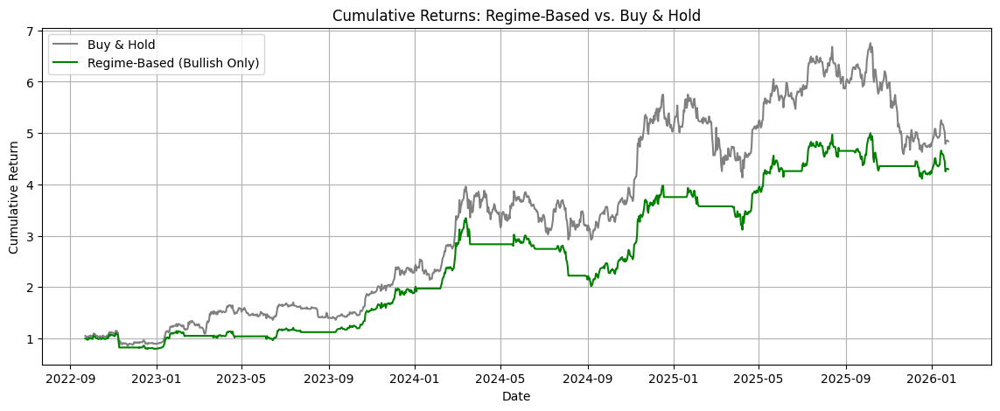

Strategy Sharpe: 1.18, Max Drawdown: -39.56%
Buy & Hold Sharpe: 1.03, Max Drawdown: -32.02%


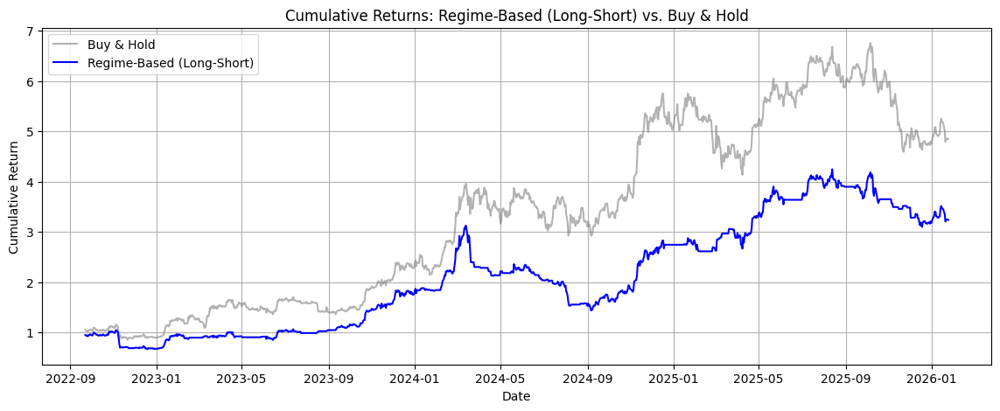

Strategy Sharpe: 0.94, Max Drawdown: -53.98%
Buy & Hold Sharpe: 1.03, Max Drawdown: -32.02%


,n_components,3
,covariance_type,'full'
,min_covar,0.001
,startprob_prior,1.0
,transmat_prior,1.0
,means_prior,0
,means_weight,0
,covars_prior,0.01
,covars_weight,1
,algorithm,'map'
,random_state,42


In [ ]:
hmm_pipeline(
    df=df,
    df_features=df_features,
    model_type='GaussianHMM',
    n_states=3,
    scale = True,
    split = 0.6,
    state_labels = ['Bearish', 'Sideways', 'Bullish']
)

Shapes before alignment: df=(3083, 5), df_features=(3053, 5)
Shapes after alignment: df=(3053, 5), df_features=(3053, 5)
Training data: 1831 candles (2017-09-16 - 2022-09-20)
Test data: 1222 candles (2022-09-21 - 2026-01-24)
Scaling features using StandardScaler...
Converged: True
Iterations: 121
Final log-likelihood: 2592.884025319222


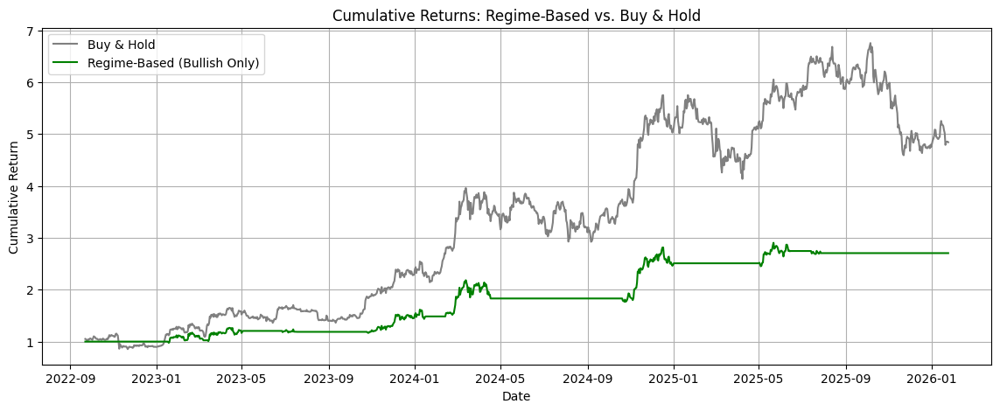

Strategy Sharpe: 0.98, Max Drawdown: -19.01%
Buy & Hold Sharpe: 1.03, Max Drawdown: -32.02%


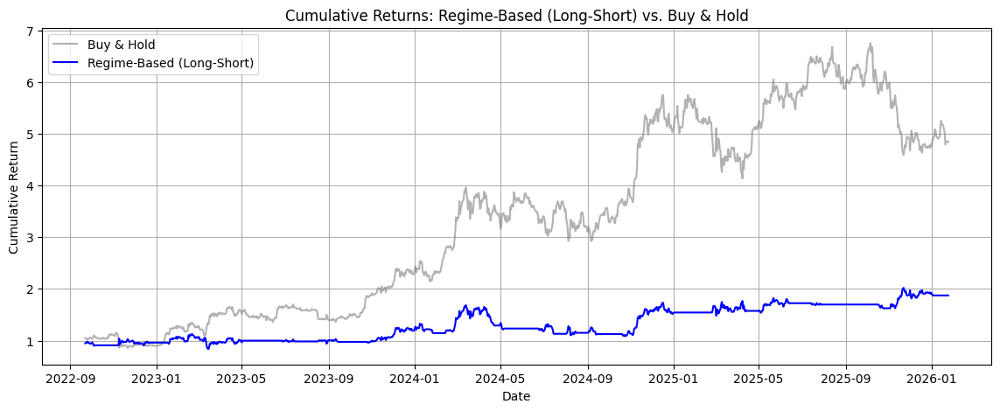

Strategy Sharpe: 0.56, Max Drawdown: -35.43%
Buy & Hold Sharpe: 1.03, Max Drawdown: -32.02%


,n_components,3
,n_mix,2
,min_covar,0.001
,startprob_prior,1.0
,transmat_prior,1.0
,weights_prior,"array([[1., 1... [1., 1.]])"
,means_prior,"array([[[0., ...0., 0., 0.]]])"
,means_weight,"array([[0., 0... [0., 0.]])"
,covars_prior,"array([[[[0.,...., 0., 0.]]]])"
,covars_weight,"array([[-7., ... [-7., -7.]])"
,algorithm,'map'


In [10]:
hmm_pipeline(
    df=df,
    df_features=df_features,
    model_type='GMMHMM',
    n_states = 3,
    scale = True,
    split = 0.6,
    state_labels = ['Bearish', 'Sideways', 'Bullish']
)